# Part 1: Vectorization_and_Term_Analysis

## First Vectorized Representation


Our goal in this exercise is to BEGIN coming to a common agreement, among this class, as to what terms we will use as we selectively refine our corpus-wide vocabulary. This corpus vocabulary is what would represent the content of each different document for clustering and classification purposes, which will be our next step. This means that we need to make decisions - what is in, what is out.

In [ ]:
# Workaround for numpy downgrade caused by gensim

# Cell 1: Pre-installation Setup
# This cell will prepare the environment with compatible versions
# IMPORTANT: Put this at the very beginning of your notebook

# First, install the correct numpy version that gensim requires
!pip install numpy==1.26.4 --force-reinstall

# Then install gensim with the specific dependencies
!pip install gensim==4.3.3
!pip install scipy==1.13.1

# Force restart the runtime programmatically
import os
import IPython

# This will restart the runtime without user intervention
try:
    os._exit(00)
except:
    pass

# In Google Colab, the notebook will end (crash) here.

  Using cached numpy-1.26.4-cp311-cp311-manylinux_2_17_x86_64.manylinux2014_x86_64.whl.metadata (61 kB)
Using cached numpy-1.26.4-cp311-cp311-manylinux_2_17_x86_64.manylinux2014_x86_64.whl (18.3 MB)
  Attempting uninstall: numpy
    Found existing installation: numpy 1.26.4
    Uninstalling numpy-1.26.4:
      Successfully uninstalled numpy-1.26.4
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
thinc 8.3.6 requires numpy<3.0.0,>=2.0.0, but you have numpy 1.26.4 which is incompatible.


In [1]:
# Cell 2: Verify installation and import all libraries
# After the automatic restart, this will be the first cell to run

# In Google Colab, select Runtime > Run cell and below
import numpy as np
print(f"NumPy version: {np.__version__}")

import gensim
print(f"Gensim version: {gensim.__version__}")

NumPy version: 1.26.4
Gensim version: 4.3.3


In [2]:
import pandas as pd
import os
import numpy as np
import re
import string
import seaborn as sns
import matplotlib.pyplot as plt
import nltk
import random
from dataclasses import dataclass

from nltk.stem.wordnet import WordNetLemmatizer
from nltk.stem import PorterStemmer

import gensim
from gensim.models import Word2Vec
from gensim.models.doc2vec import Doc2Vec, TaggedDocument

from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.feature_extraction.text import CountVectorizer
from sklearn.metrics.pairwise import cosine_similarity
from sklearn.manifold import TSNE

import scipy.cluster.hierarchy

from IPython.display import display, HTML

from typing import List, Callable, Dict

### Mount Google Drive to Colab Environment

<div class="alert alert-block alert-success">
    <b>Directories Required for Research Assignment</b>:<br>
1. Data Directory - Source Class Corpus Data<br>
2. Output Directory - Vocabulary<br>
</div>

#### Uncomment To Map Drive

In [3]:
from google.colab import drive
#drive.mount('/content/gdrive/My Drive')
##drive.mount('/content/gdrive/')

### NLTK Downloads

In [4]:
# Only run this once, they will be downloaded.
nltk.download('stopwords',quiet=True)
nltk.download('wordnet',quiet=True)
#nltk.download('punkt',quiet=True)  # replaced by punkt due to "unsafe pickling" by NLTK developers
nltk.download('omw-1.4',quiet=True)
nltk.download('punkt_tab',quiet=True)

True

<div class="alert alert-block alert-danger">
<b>Gensim</b> is a Python library for topic modelling, document indexing and similarity retrieval with large corpora. Target audience is the natural language processing (NLP) and information retrieval (IR) community <br><br>
    <b>https://pypi.org/project/gensim/ </b>
</div>

In [5]:
import pkg_resources
#pkg_resources.require("gensim<=3.8.3");

<ipython-input-5-da50371301cc>:1: DeprecationWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/latest/pkg_resources.html
  import pkg_resources


In [6]:
print("Genism Version: ", gensim.__version__)

Genism Version:  4.3.3


<div class="alert alert-block alert-info">
    <b>Suppress warning messages</b></div>

In [7]:
def warn(*args, **kwargs):
    pass
import warnings
warnings.warn = warn

## Utility Functions

In [8]:
def add_movie_descriptor(data: pd.DataFrame, corpus_df: pd.DataFrame):
    """
    Adds "Movie Description" to the supplied dataframe, in the form {Genre}_{P|N}_{Movie Title}_{DocID}
    """
    review = np.where(corpus_df['Review Type (pos or neg)'] == 'Positive', 'P', 'N')
    data['Descriptor'] = corpus_df['Genre of Movie'] + '_' + corpus_df['Movie Title'] + '_' + review + '_' + corpus_df['Doc_ID'].astype(str)

def get_corpus_df(path):
    data = pd.read_csv(path, encoding="utf-8")
    add_movie_descriptor(data, data)
    sorted_data = data.sort_values(['Descriptor'])
    indexed_data = sorted_data.set_index(['Doc_ID'])
    indexed_data['Doc_ID'] = indexed_data.index
    return indexed_data

def remove_punctuation(text):
    return re.sub('[^a-zA-Z]', ' ', str(text))

def lower_case(text):
    return text.lower()

def remove_tags(text):
    return re.sub("&lt;/?.*?&gt;"," &lt;&gt; ", text)

def remove_special_chars_and_digits(text):
    return re.sub("(\\d|\\W)+"," ", text)

@dataclass
class Document:
    doc_id: str
    text: str

def normalize_document(document: Document) -> Document:
    text = document.text
    text = remove_punctuation(text)
    text = lower_case(text)
    text = remove_tags(text)
    text = remove_special_chars_and_digits(text)

    return Document(document.doc_id, text)

def normalize_documents(documents: List[Document]) -> List[Document]:
    """
    Normalizes text for all given documents.
    Removes punctuation, converts to lower case, removes tags and special characters.
    """
    return [normalize_document(x) for x in documents]

@dataclass
class TokenizedDocument:
    doc_id: str
    tokens: List[str]

def tokenize_document(document: Document) -> TokenizedDocument:
    tokens = nltk.word_tokenize(document.text)
    return TokenizedDocument(document.doc_id, tokens)

def tokenize_documents(documents: List[Document]) -> List[TokenizedDocument]:
    return [tokenize_document(x) for x in documents]

def lemmatize(documents: List[TokenizedDocument]) -> List[TokenizedDocument]:
    result = []
    lemmatizer = WordNetLemmatizer()
    for document in documents:
        output_tokens = [lemmatizer.lemmatize(w) for w in document.tokens]
        result.append(TokenizedDocument(document.doc_id, output_tokens))

    return result

def stem(documents: List[TokenizedDocument]) -> List[TokenizedDocument]:
    result = []
    stemmer = PorterStemmer()
    for document in documents:
        output_tokens = [stemmer.stem(w) for w in document.tokens]
        result.append(TokenizedDocument(document.doc_id, output_tokens))

    return result

def remove_stop_words(documents: List[TokenizedDocument]) -> List[TokenizedDocument]:
    result = []

    stop_words = set(nltk.corpus.stopwords.words('english'))
    for document in documents:
        filtered_tokens = [w for w in document.tokens if not w in stop_words]
        result.append(TokenizedDocument(document.doc_id, filtered_tokens))

    return result

def add_flags(data: pd.DataFrame, oblivion_doc_ids: List[int], scifi_doc_ids: List[int]):
    data['is_oblivion'] = data.index.isin(oblivion_doc_ids)
    data['is_scifi'] = data.index.isin(scifi_doc_ids)

def get_all_tokens(documents: List[TokenizedDocument]) -> List[str]:
    tokens = {y for x in documents for y in x.tokens}
    return sorted(list(tokens))

## Loading the corpus

In [9]:
CORPUS_PATH='https://raw.githubusercontent.com/barrycforever/MSDS_453_NLP/refs/heads/main/MSDS453_ClassCorpus/MSDS453_ClassCorpus_Final_Sec56_v1_20250412.csv'
corpus_df = get_corpus_df(CORPUS_PATH)
documents = [Document(x, y) for x, y in zip(corpus_df.Doc_ID, corpus_df.Text)]

In [10]:
# CORPUS_PATH = './data/MSDS453_Sec57_TestQA_ClassCorpus.csv'
# corpus_df = get_corpus_df(CORPUS_PATH)
# documents = [Document(x, y) for x, y in zip(corpus_df.Doc_ID, corpus_df.Text)]

1. Dataframe = corpus_df
2. List = documents (Document ID, Text)

## Exploritory Data Analysis

In [11]:
corpus_df.shape

(230, 9)

In [12]:
corpus_df.head(4).T

Doc_ID,226,227,228,229
DSI_Title,RPX_Doc6_Angel_Has_Fallen,RPX_Doc7_Angel_Has_Fallen,RPX_Doc8_Angel_Has_Fallen,RPX_Doc9_Angel_Has_Fallen
Submission File Name,RPX_Doc6_Angel_Has_Fallen,RPX_Doc7_Angel_Has_Fallen,RPX_Doc8_Angel_Has_Fallen,RPX_Doc9_Angel_Has_Fallen
Student Name,RPX,RPX,RPX,RPX
Genre of Movie,Action,Action,Action,Action
Review Type (pos or neg),Negative,Negative,Negative,Negative
Movie Title,Angel_Has_Fallen,Angel_Has_Fallen,Angel_Has_Fallen,Angel_Has_Fallen
Text,"Target is on the move."" Heavily outnumbered an...",The only question lingering in your mind while...,"The sleepy, dopey action bonanza ""Angel Has Fa...",I don't know what I was hoping to get from Ang...
Descriptor,Action_Angel_Has_Fallen_N_226,Action_Angel_Has_Fallen_N_227,Action_Angel_Has_Fallen_N_228,Action_Angel_Has_Fallen_N_229
Doc_ID,226,227,228,229


In [13]:
print(corpus_df.info());

<class 'pandas.core.frame.DataFrame'>
Index: 230 entries, 226 to 295
Data columns (total 9 columns):
 #   Column                    Non-Null Count  Dtype 
---  ------                    --------------  ----- 
 0   DSI_Title                 230 non-null    object
 1   Submission File Name      230 non-null    object
 2   Student Name              230 non-null    object
 3   Genre of Movie            230 non-null    object
 4   Review Type (pos or neg)  230 non-null    object
 5   Movie Title               230 non-null    object
 6   Text                      230 non-null    object
 7   Descriptor                230 non-null    object
 8   Doc_ID                    230 non-null    int64 
dtypes: int64(1), object(8)
memory usage: 18.0+ KB
None


In [14]:
print(corpus_df['Movie Title'].unique())

['Angel_Has_Fallen' 'Inception' 'No_Time_to_Die' 'Sudden_Impact' 'Taken'
 'Taxi' 'Barbie' "Don't_Look_Up" 'Holmes_and_Watson' 'Lost_city'
 'Mean_Girls' 'Red_Notice' 'Drag_me_to_hell' 'It_Chapter_Two' 'Lamb'
 'Orphan' 'TheOthers' 'The_conjuring_2' 'Batman' 'Equilibrium'
 'Minority_Report' 'Oblivion' 'Pitch_Black']


## Number of Reviews By Genre

In [15]:
counts_df = corpus_df[['Genre of Movie']].copy()
counts_df['Count'] = 1
counts_df.groupby(['Genre of Movie']).count().reset_index()

,Genre of Movie,Count
0,Action,60
1,Comedy,60
2,Horror,60
3,Sci-Fi,50


In [16]:
corpus_df.columns

Index(['DSI_Title', 'Submission File Name', 'Student Name', 'Genre of Movie',
       'Review Type (pos or neg)', 'Movie Title', 'Text', 'Descriptor',
       'Doc_ID'],
      dtype='object')

## Normalized Document

1. remove_punctuation(text)
2. lower_case(text)
3. remove_tags(text)
4. remove_special_chars_and_digits(text)
5. return Document(document.doc_id, text)

In [17]:
normalized_documents = normalize_documents(documents)
normalized_documents[0]

Document(doc_id=226, text='target is on the move heavily outnumbered and outgunned mike banning gerard butler strives to exit a multi level bullet riddled structure as squadrons of soldiers descend upon his position but thanks to his skills he s perfectly capable of overcoming the incredible odds or at least that s what the overwrought editing will have audiences assume in this opening sequence alone the camerawork is so shaky and hard to follow that it s impossible to know exactly what is going on back in washington d c banning awaits an offer to become the director of the secret service for president allan trumbull morgan freeman but despite his many years on the job working to protect the president from all sorts of mayhem mike isn t certain he s ready to sit behind a desk for the rest of his career his abuse of pills for migraines dizziness and insomnia doesn t help in making the decision though his wife leah piper perabo and their infant daughter lynn would probably appreciate the

## Standardize Document

#### NLTK Tokenizer Package

https://www.nltk.org/api/nltk.tokenize.html

Tokenizers divide strings into lists of substrings. For example, tokenizers can be used to find the words and punctuation in a string:

### Functions for Tokenization Process
1. tokenize_document
2. tokenize_documents

In [18]:
tokenized_documents = tokenize_documents(normalized_documents)
tokenized_documents[0]

TokenizedDocument(doc_id=226, tokens=['target', 'is', 'on', 'the', 'move', 'heavily', 'outnumbered', 'and', 'outgunned', 'mike', 'banning', 'gerard', 'butler', 'strives', 'to', 'exit', 'a', 'multi', 'level', 'bullet', 'riddled', 'structure', 'as', 'squadrons', 'of', 'soldiers', 'descend', 'upon', 'his', 'position', 'but', 'thanks', 'to', 'his', 'skills', 'he', 's', 'perfectly', 'capable', 'of', 'overcoming', 'the', 'incredible', 'odds', 'or', 'at', 'least', 'that', 's', 'what', 'the', 'overwrought', 'editing', 'will', 'have', 'audiences', 'assume', 'in', 'this', 'opening', 'sequence', 'alone', 'the', 'camerawork', 'is', 'so', 'shaky', 'and', 'hard', 'to', 'follow', 'that', 'it', 's', 'impossible', 'to', 'know', 'exactly', 'what', 'is', 'going', 'on', 'back', 'in', 'washington', 'd', 'c', 'banning', 'awaits', 'an', 'offer', 'to', 'become', 'the', 'director', 'of', 'the', 'secret', 'service', 'for', 'president', 'allan', 'trumbull', 'morgan', 'freeman', 'but', 'despite', 'his', 'many', '

## Useful Lookups (Titles by DocID, Genres by DocID, Description by DocID)

In [19]:
titles_by_doc_ids = {x: y for x, y in zip(corpus_df['Doc_ID'], corpus_df['Movie Title'])}
genres_by_doc_ids = {x: y for x, y in zip(corpus_df['Doc_ID'], corpus_df['Genre of Movie'])}
descriptors_by_doc_ids = {x: y for x, y in zip(corpus_df['Doc_ID'], corpus_df['Descriptor'])}

scifi_doc_ids = [int(x) for x in corpus_df['Doc_ID'] if genres_by_doc_ids[x] == 'Sci-Fi']
scifi_documents = [x for x in documents if x.doc_id in scifi_doc_ids]

non_scifi_doc_ids = {int(x) for x in corpus_df['Doc_ID'] if genres_by_doc_ids[x] != 'Sci-Fi'}
non_scifi_documents = [x for x in documents if x.doc_id in non_scifi_doc_ids]

## Lookup for Specific Movie Title

In [20]:
print(corpus_df['Movie Title'].unique())

['Angel_Has_Fallen' 'Inception' 'No_Time_to_Die' 'Sudden_Impact' 'Taken'
 'Taxi' 'Barbie' "Don't_Look_Up" 'Holmes_and_Watson' 'Lost_city'
 'Mean_Girls' 'Red_Notice' 'Drag_me_to_hell' 'It_Chapter_Two' 'Lamb'
 'Orphan' 'TheOthers' 'The_conjuring_2' 'Batman' 'Equilibrium'
 'Minority_Report' 'Oblivion' 'Pitch_Black']


In [21]:
oblivion_doc_ids = [int(x) for x in corpus_df['Doc_ID'] if titles_by_doc_ids[x] == 'Oblivion']
oblivion_documents = [x for x in documents if x.doc_id in oblivion_doc_ids]

## Qualitative Term Determinations

#### Terms Determined by Document of Interest

In [22]:
candidate_terms = [
    'jack harper',
    'earth',
    'space station',
    'alien invasion',
    'memory',
    'science fiction',
    'mission',
    'identity',
    'terraforming expedition',
    'tom cruise'
]

## CountVectorizer

<div class="alert alert-block alert-success">
    <b>sklearn.feature_extraction.text.CountVectorizer</b>:<br>
Convert a collection of text documents to a matrix of token counts.<br>
This implementation produces a sparse representation of the counts using scipy.sparse.csr_matrix.<br>
If you do not provide an a-priori dictionary and you do not use an analyzer that does some kind of feature selection then the number of features will be equal to the vocabulary size found by analyzing the data.
</div>

In [23]:
vectorizer = CountVectorizer(ngram_range=(1, 2))
text_for_counts = [x.text for x in normalized_documents]
matrix = vectorizer.fit_transform(text_for_counts)
words = vectorizer.get_feature_names_out()
word_counts = pd.DataFrame(matrix.toarray(), columns=words, index=corpus_df.Doc_ID)

In [24]:
add_flags(word_counts, oblivion_doc_ids, scifi_doc_ids)
word_counts['Doc_ID'] = word_counts.index

In [25]:
# Collect result into a dataframe
mean_frequencies = pd.DataFrame(index=candidate_terms)

oblivion_mean_frequencies = word_counts[word_counts.is_oblivion][[x for x in candidate_terms if x in word_counts.columns]].mean()
mean_frequencies['Oblivion'] = oblivion_mean_frequencies

scifi_mean_frequencies = word_counts[word_counts.is_scifi][[x for x in candidate_terms if x in word_counts.columns]].mean()
mean_frequencies['All Sci-Fi'] = scifi_mean_frequencies

non_scifi_mean_frequencies = word_counts[~word_counts.is_scifi][[x for x in candidate_terms if x in word_counts.columns]].mean()
mean_frequencies['All Non-Sci-Fi'] = non_scifi_mean_frequencies

In [26]:
mean_frequencies.fillna(0.0).sort_values(['Oblivion'], ascending=False)

,Oblivion,All Sci-Fi,All Non-Sci-Fi
earth,2.5,0.52,0.105556
science fiction,1.7,0.66,0.011111
tom cruise,1.5,0.48,0.016667
jack harper,0.9,0.18,0.000000
mission,0.5,0.12,0.072222
memory,0.4,0.12,0.016667
space station,0.3,0.06,0.000000
alien invasion,0.3,0.10,0.000000
identity,0.1,0.04,0.027778
terraforming expedition,0.1,0.02,0.000000


In [27]:
# These are identified
important_prevalent_terms = [
  'earth',
  'science fiction',
  'tom cruise',
  'mission'
]
stemmer = PorterStemmer()
stemmed_important_prevalent_terms = [stemmer.stem(x) for x in important_prevalent_terms]

In [28]:
pd.options.display.float_format = '{:,.2f}'.format
mean_frequencies.fillna(0.0).loc[important_prevalent_terms].round(2).sort_values(['Oblivion'], ascending=False)

,Oblivion,All Sci-Fi,All Non-Sci-Fi
earth,2.50,0.52,0.11
science fiction,1.70,0.66,0.01
tom cruise,1.50,0.48,0.02
mission,0.50,0.12,0.07


## TF-IDF Experiment Functions - Text Normalization

In [29]:
def run_tfidf(documents: List[Document],
              clean_func: Callable[[List[Document]], List[TokenizedDocument]],
              important_prevalent_terms: List[str],
              experiment_name: str,
              output_tfidf_vectors: bool=False,
              output_vocabulary: bool=True):
    cleaned_documents = clean_func(documents)
    cleaned_document_text = [' '.join(x.tokens) for x in cleaned_documents]

    vectorizer = TfidfVectorizer(use_idf=True,
                                 ngram_range=(1, 2),
                                 norm=None)

    transformed_documents = vectorizer.fit_transform(cleaned_document_text)
    transformed_documents_as_array = transformed_documents.toarray()

    output_dir = f'output/{experiment_name}_Results'
    if not os.path.exists(output_dir):
        os.makedirs(output_dir)

    if output_tfidf_vectors:
        for counter, doc in enumerate(transformed_documents_as_array):
            tf_idf_tuples = list(zip(vectorizer.get_feature_names_out(), doc))
            one_doc_as_df = pd.DataFrame.from_records(tf_idf_tuples, columns=['term', 'score'])\
                                        .sort_values(by='score', ascending=False)\
                                        .reset_index(drop=True)

            one_doc_as_df.to_csv(f'{output_dir}/{corpus_df["Submission File Name"][counter]}')

    if output_vocabulary:
        with open(f'{output_dir}/vocabulary.txt', 'w') as vocab:
            words = sorted(vectorizer.get_feature_names_out())
            print('\n'.join(words), file=vocab)

    # Create document-term dataframe
    doc_term_matrix = transformed_documents.todense()
    doc_term_df = pd.DataFrame(doc_term_matrix,
                               columns=vectorizer.get_feature_names_out(),
                               index=corpus_df.Doc_ID)
    add_flags(doc_term_df, oblivion_doc_ids, scifi_doc_ids)

    # Print the top 10 mean TF-IDF values
    top10_tfidf = pd.DataFrame(doc_term_df.mean().sort_values(ascending=False).head(10))
    top10_tfidf.rename(columns={0: 'Mean TF-IDF'}, inplace=True)
    display(top10_tfidf)

    # Collect result into a dataframe
    tfidf_results = pd.DataFrame(index=candidate_terms)

    all_tfidf_results = doc_term_df[[x for x in candidate_terms if x in doc_term_df.columns]].mean().round(2)
    tfidf_results['All Movies'] = all_tfidf_results

    print("Mean TF-IDF Scores for Part 1 Selected Terms")
    display(tfidf_results)

    plt.hist(doc_term_df.mean(), 100, range=(0, 8))

    print(f'Vocabulary size: {doc_term_df.shape[1]}')

    descriptors = corpus_df['Descriptor']

    similarities = cosine_similarity(doc_term_df.loc[scifi_doc_ids], doc_term_df.loc[scifi_doc_ids])
    fig, ax = plt.subplots(figsize=(30, 30))
    labels = [descriptors_by_doc_ids[x.doc_id] for x in scifi_documents]
    sns.heatmap(ax=ax, data=similarities, xticklabels=labels, yticklabels=labels)
    #plt.savefig(f'figures/{experiment_name}_heatmap_documents.png')
    plt.show()

## TF-IDF  (Term Frequency-Inverse Document Frequency)

### Experiments, Normalize, Tokenize, Lemmatization and Stop Word Removal

In [30]:
def clean_method(documents: List[Document]) -> List[TokenizedDocument]:
    """
    Normalizes text, tokenizes, lemmatizes, and removes stop words.
    """
    documents = normalize_documents(documents)
    documents = tokenize_documents(documents)
    documents = lemmatize(documents)
    documents = remove_stop_words(documents)
    documents = stem(documents)

    return documents

,Mean TF-IDF
film,3.68
movi,2.81
ha,2.34
barbi,2.32
wa,2.28
like,2.10
one,2.10
time,1.80
charact,1.80
make,1.63


Mean TF-IDF Scores for Part 1 Selected Terms


,All Movies
jack harper,0.17
earth,0.61
space station,0.07
alien invasion,NaN
memory,NaN
science fiction,NaN
mission,0.35
identity,NaN
terraforming expedition,NaN
tom cruise,NaN


Vocabulary size: 64626


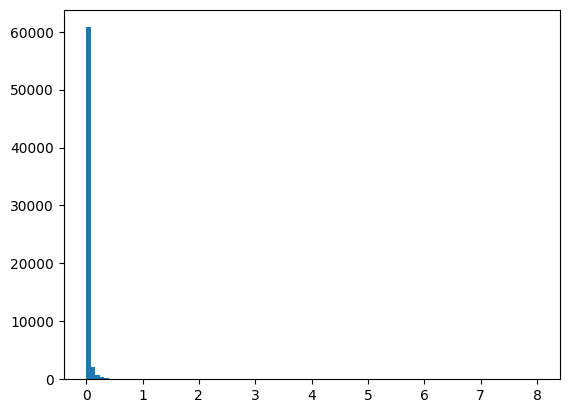

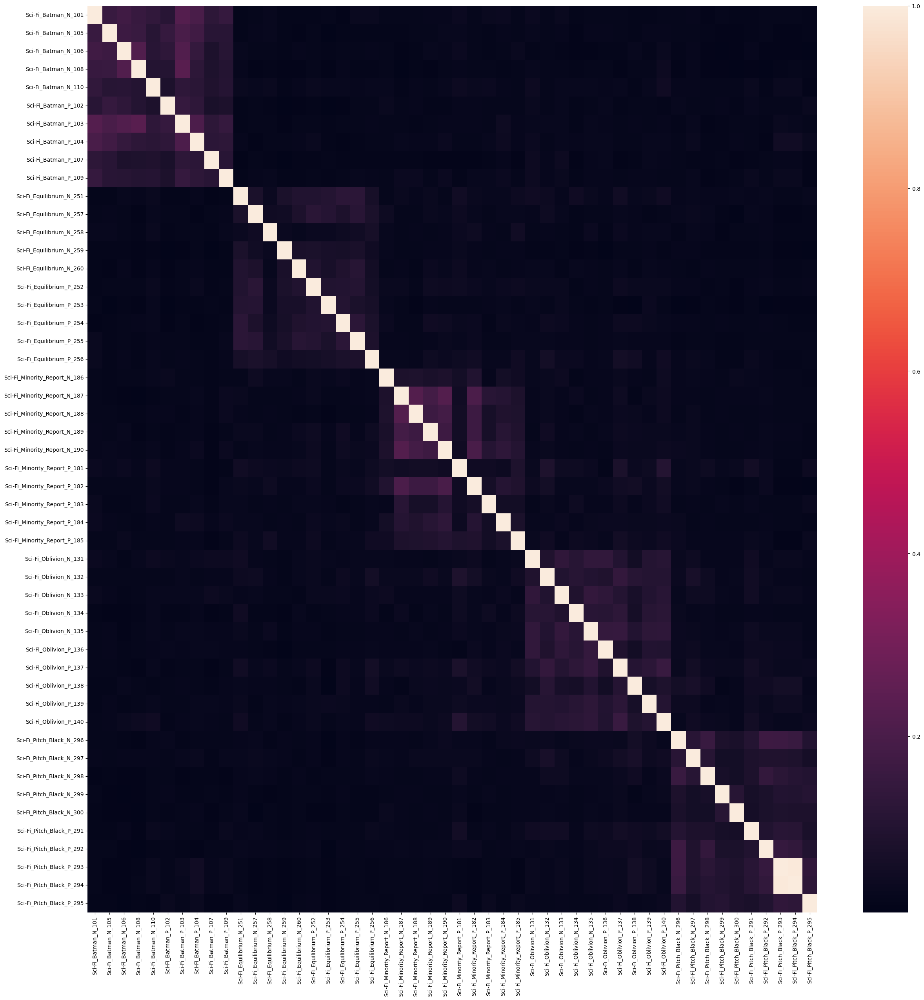

In [31]:
run_tfidf(documents, clean_method, important_prevalent_terms, 'TFIDF_exp')

## Word2Vec

<div class="alert alert-block alert-success">
    <b>Word2vec embeddings</b>: https://radimrehurek.com/gensim/models/word2vec.html <br>
    This module implements the word2vec family of algorithms, using highly optimized C routines, data streaming and Pythonic interfaces.
            </div>

## Utility Functions For Word2Vec Experiments

In [32]:
def get_word2vec_vectors(documents: List[TokenizedDocument], embedding_size: int) -> pd.DataFrame:
    tokens = [x.tokens for x in documents]

    word2vec_model = Word2Vec(sentences=tokens, vector_size=embedding_size, window=3, min_count=1, workers=12)

    vectors = {}
    for i in word2vec_model.wv.index_to_key:
        temp_vec = word2vec_model.wv[i]
        vectors[i] = temp_vec

    result = pd.DataFrame(vectors).transpose()
    result = result.sort_index()
    return result

def plot_similarity_matrix(data: pd.DataFrame, experiment_name: str, figsize=(25, 25)):
    similarities = cosine_similarity(data, data)
    fig, ax = plt.subplots(figsize=figsize)
    sns.heatmap(ax=ax, data=similarities, xticklabels=data.index, yticklabels=data.index);
    #plt.savefig(f'figures/{experiment_name}_heatmap.png')
    plt.close()

def plot_similarity_clustermap(data: pd.DataFrame, experiment_name: str, figsize=(25, 25)):
    similarities = cosine_similarity(data, data)
    cm = sns.clustermap(similarities, metric='cosine', xticklabels=data.index, yticklabels=data.index, method='complete', cmap='RdBu', figsize=figsize)
    cm.ax_row_dendrogram.set_visible(False)
    cm.ax_col_dendrogram.set_visible(False)
    plt.legend(loc='upper left')
    #plt.savefig(f'figures/{experiment_name}_clustermap.png')
    plt.show()
    plt.close()

def plot_tsne(data: pd.DataFrame, perplexity: int, experiment_name: str, figsize=(40, 40)):
    """
    Creates a TSNE plot of the supplied dataframe
    """
    tsne_model = TSNE(perplexity=perplexity, n_components=2, learning_rate='auto', init='pca', n_iter=1000, random_state=32)
    new_values = tsne_model.fit_transform(data)

    x = []
    y = []
    for value in new_values:
        x.append(value[0])
        y.append(value[1])

    plt.figure(figsize=figsize)
    labels = list(data.index)
    for i in range(len(x)):
        new_value = new_values[i]
        x = new_value[0]
        y = new_value[1]

        plt.scatter(x, y)
        plt.annotate(labels[i],
                     xy=(x, y),
                     xytext=(5, 2),
                     textcoords='offset points',
                     ha='right',
                     va='bottom')
    #plt.savefig(f'figures/{experiment_name}_tsne.png')
    plt.show()
    plt.close()

def run_word2vec_experiment(documents: List[Document],
                            clean_func: Callable[[List[Document]], List[TokenizedDocument]],
                            embedding_size: int,
                            chosen_tokens: List[str],
                            experiment_name: str):
    cleaned_documents = clean_func(documents)

    word2vec_df = get_word2vec_vectors(cleaned_documents, embedding_size)
    chosen_tokens = [token for token in chosen_tokens if token in word2vec_df.index]
    filtered_word2vec_df = word2vec_df.loc[chosen_tokens].copy()

    plot_tsne(filtered_word2vec_df, 30, experiment_name)
    plot_similarity_matrix(filtered_word2vec_df, experiment_name)
    plot_similarity_clustermap(filtered_word2vec_df, experiment_name)

In [33]:
extra_terms = [
  'earth',
  'fiction',
  'tom',
  'mission'
]

In [34]:
# Get our terms to examine in experiements 4-12
all_tokens = get_all_tokens(remove_stop_words(clean_method(documents)))
chosen_tokens = random.choices(all_tokens, k=100 - len(extra_terms)) + extra_terms

lemmatizer = WordNetLemmatizer()
lemmatized_chosen_tokens = [lemmatizer.lemmatize(x) for x in chosen_tokens]
stemmed_chosen_tokens = [stemmer.stem(x) for x in lemmatized_chosen_tokens]

## Word2Vec Experiments:


<div class="alert alert-block alert-success">
    <b>Word2vec embeddings</b>: https://radimrehurek.com/gensim/models/word2vec.html <br>
    This module implements the word2vec family of algorithms, using highly optimized C routines, data streaming and Pythonic interfaces.
            </div>

Running Word2Vec experiment with embedding size: 100


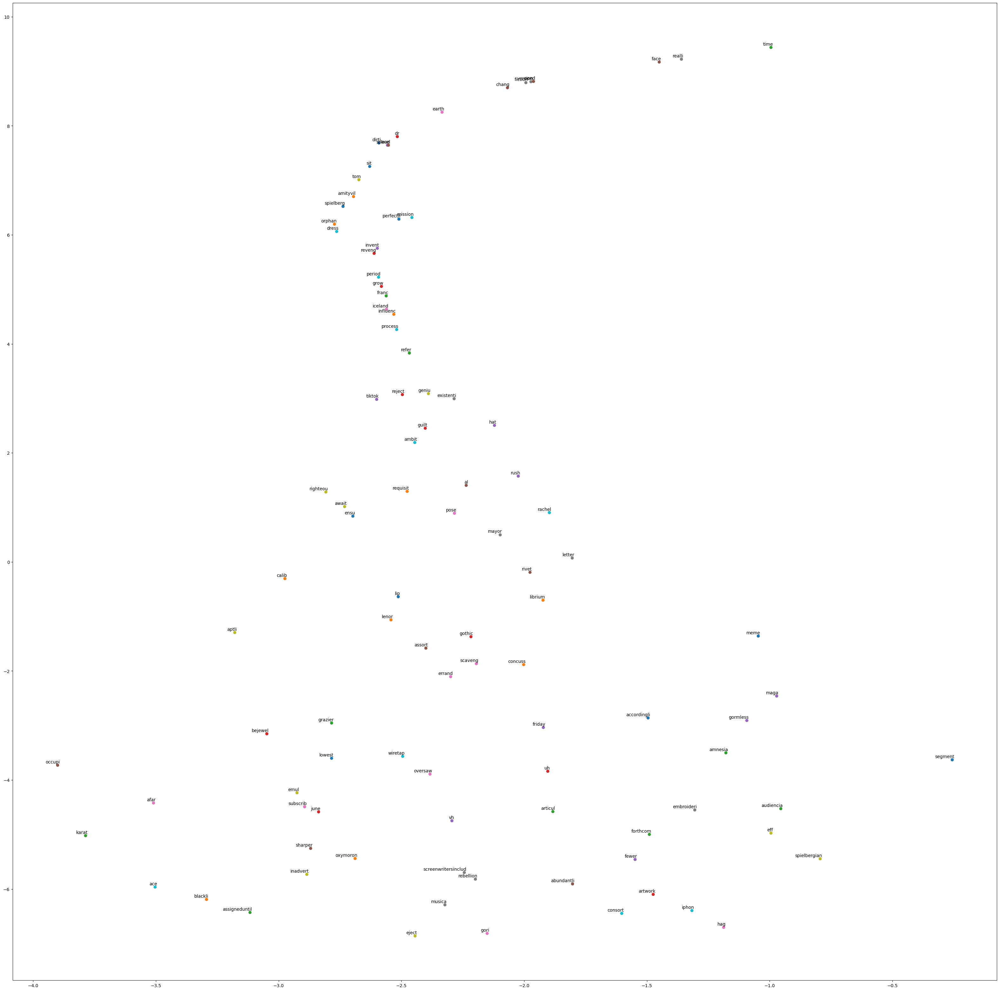

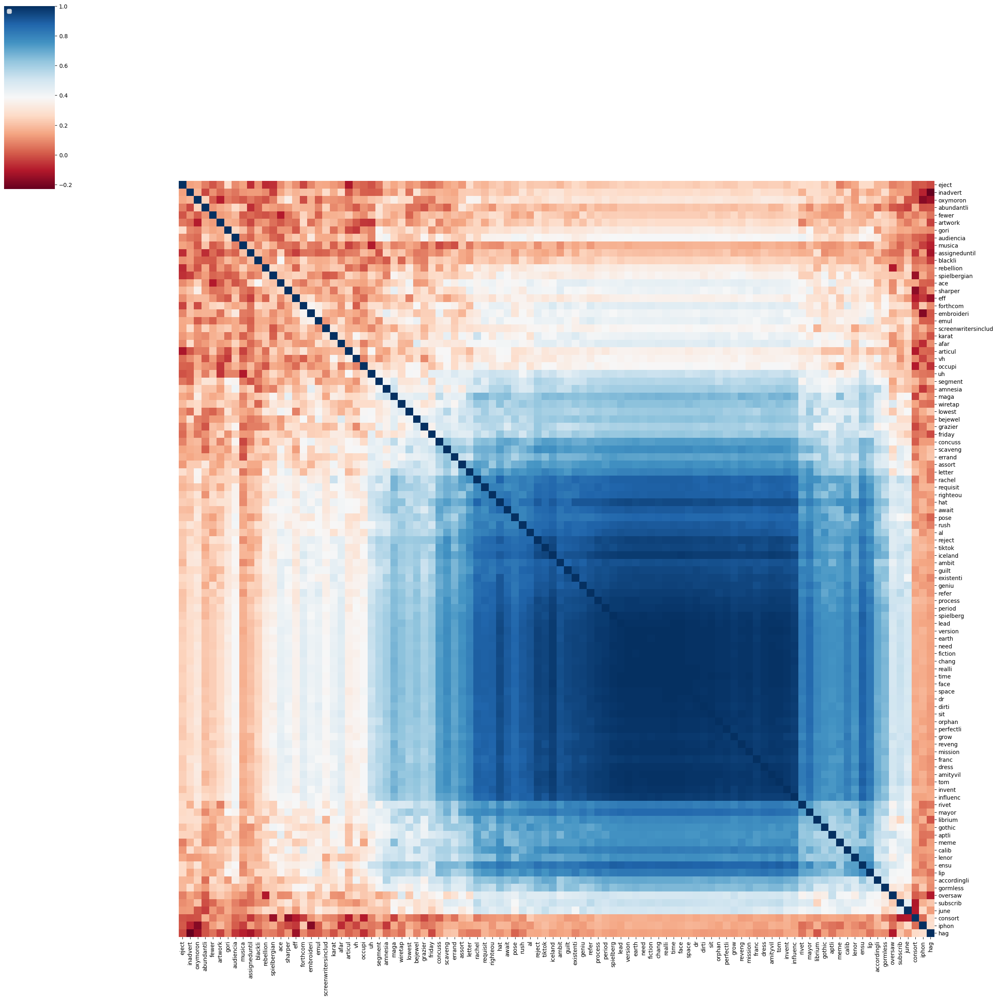

Running Word2Vec experiment with embedding size: 200


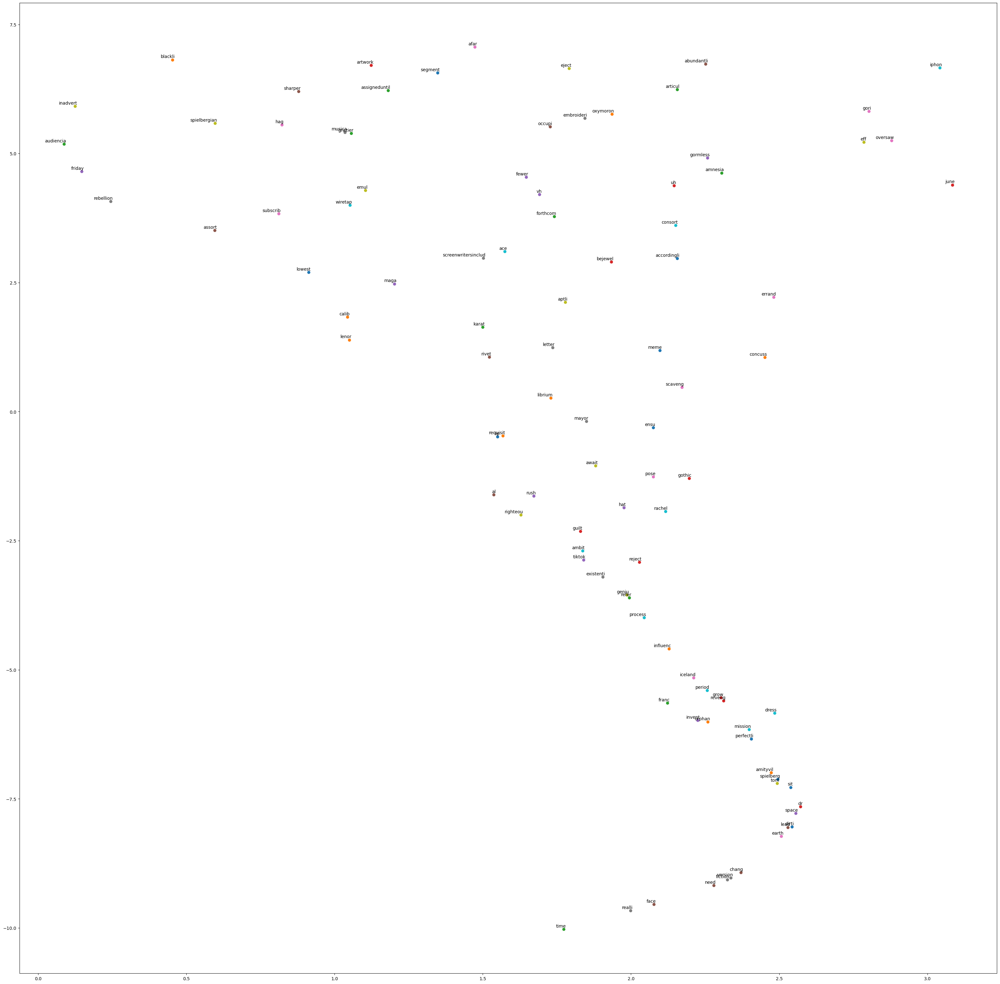

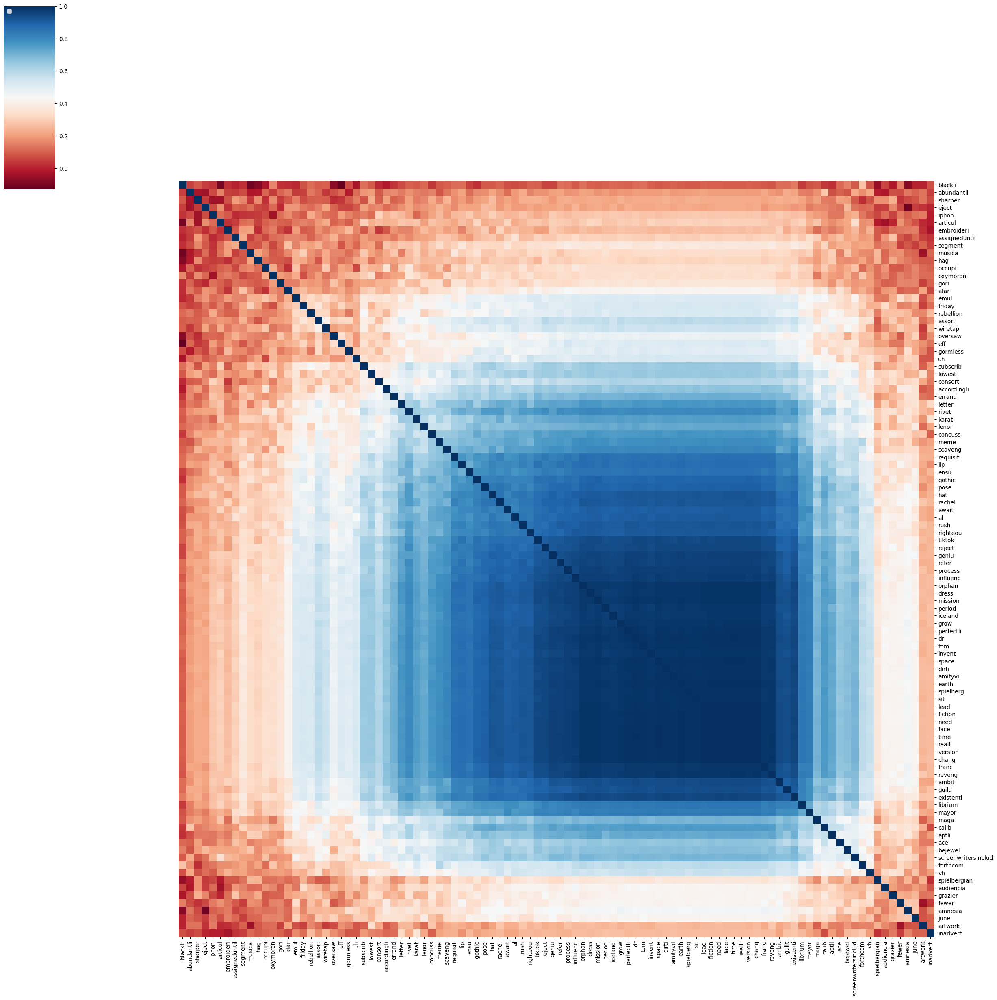

Running Word2Vec experiment with embedding size: 300


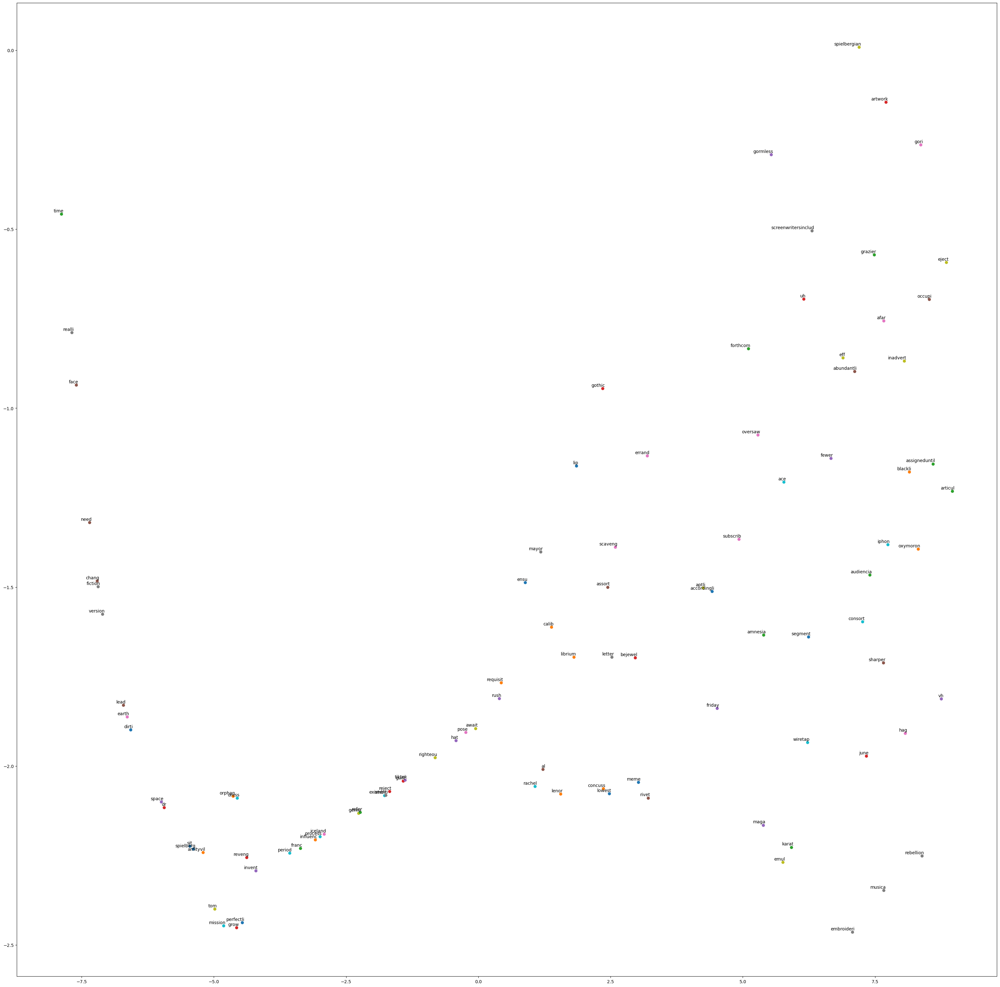

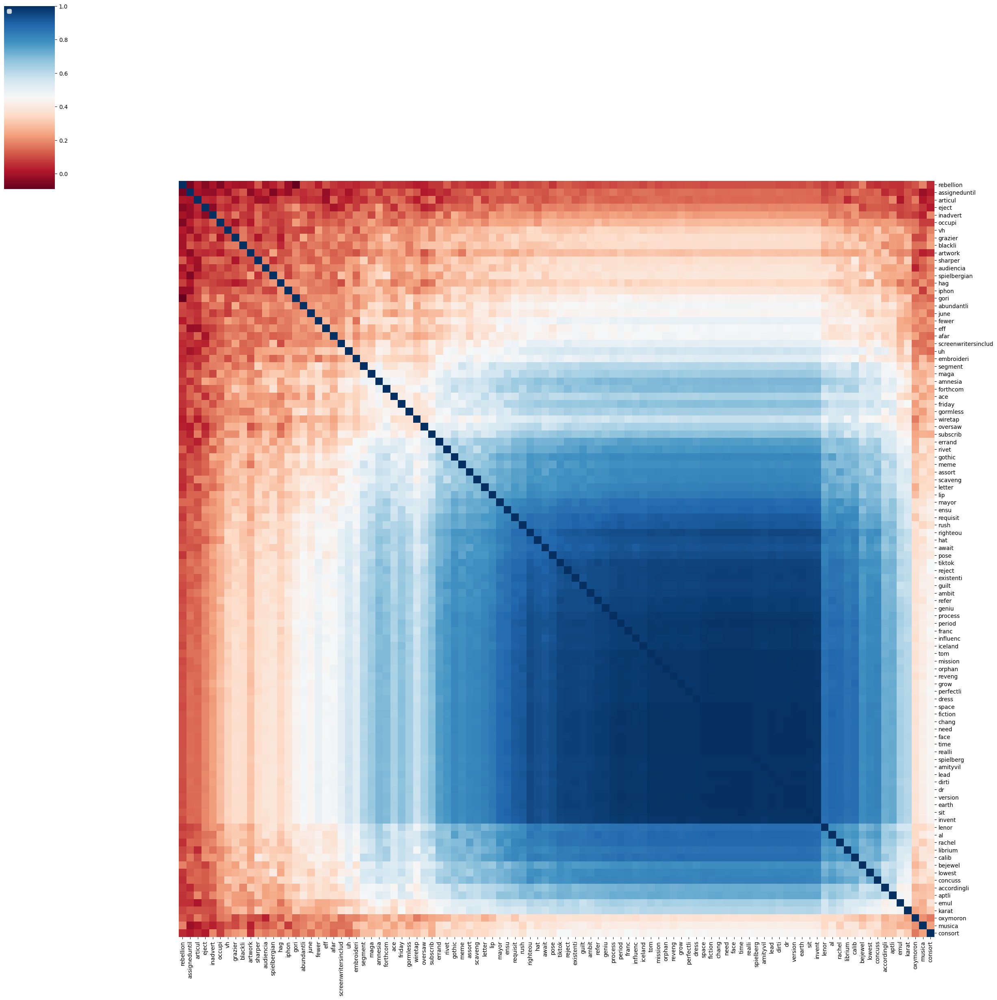

In [35]:
# List of embedding sizes to try
embedding_sizes = [100, 200, 300]

# Run the experiment for each embedding size
for size in embedding_sizes:
    print(f"Running Word2Vec experiment with embedding size: {size}")
    run_word2vec_experiment(documents, clean_method, size, stemmed_chosen_tokens, f"word2vec_{size}")

## Utility functions for Doc2Vec experiments

<div class="alert alert-block alert-success">
    <b>Doc2vec Paragraph Embeddings</b>: https://radimrehurek.com/gensim/models/doc2vec.html <br>
    Paragraph and document embeddings via the distributed memory and distributed bag of words models from Quoc Le and Tomas Mikolov: “Distributed Representations of Sentences and Documents”. <br>

The algorithms use either hierarchical softmax or negative sampling;
            </div>

In [36]:
def run_doc2vec(documents: List[TokenizedDocument], embedding_size: int, descriptors_by_doc_ids: Dict[int, str]):
    tagged_documents = [TaggedDocument(document.tokens, [i]) for i, document in enumerate(documents)]
    doc2vec_model = Doc2Vec(tagged_documents, vector_size=embedding_size, window=3, min_count=2, workers=12)

    doc2vec_df = pd.DataFrame()
    for document in documents:
        vector = pd.DataFrame(doc2vec_model.infer_vector(document.tokens)).transpose()
        doc2vec_df = pd.concat([doc2vec_df, vector], axis=0)

    doc2vec_df['Descriptor'] = [descriptors_by_doc_ids[x.doc_id] for x in documents]
    doc2vec_df.set_index(['Descriptor'], inplace=True)
    return doc2vec_df

def run_doc2vec_experiment(documents: List[Document],
                           clean_func: Callable[[List[Document]], List[TokenizedDocument]],
                           embedding_size: int,
                           experiment_name: str):
    cleaned_documents = clean_func(documents)
    doc2vec_df = run_doc2vec(cleaned_documents, embedding_size, descriptors_by_doc_ids)

    plot_similarity_matrix(doc2vec_df, experiment_name)
    plot_similarity_clustermap(doc2vec_df, experiment_name, figsize=(50, 50))
    plot_tsne(doc2vec_df, 30, experiment_name)

## Doc2Vec Experiments:

<div class="alert alert-block alert-success">
    <b>Doc2vec Paragraph Embeddings</b>: https://radimrehurek.com/gensim/models/doc2vec.html <br>
    Paragraph and document embeddings via the distributed memory and distributed bag of words models from Quoc Le and Tomas Mikolov: “Distributed Representations of Sentences and Documents”. <br>

The algorithms use either hierarchical softmax or negative sampling;
            </div>

Running Doc2Vec experiment with embedding size: 100


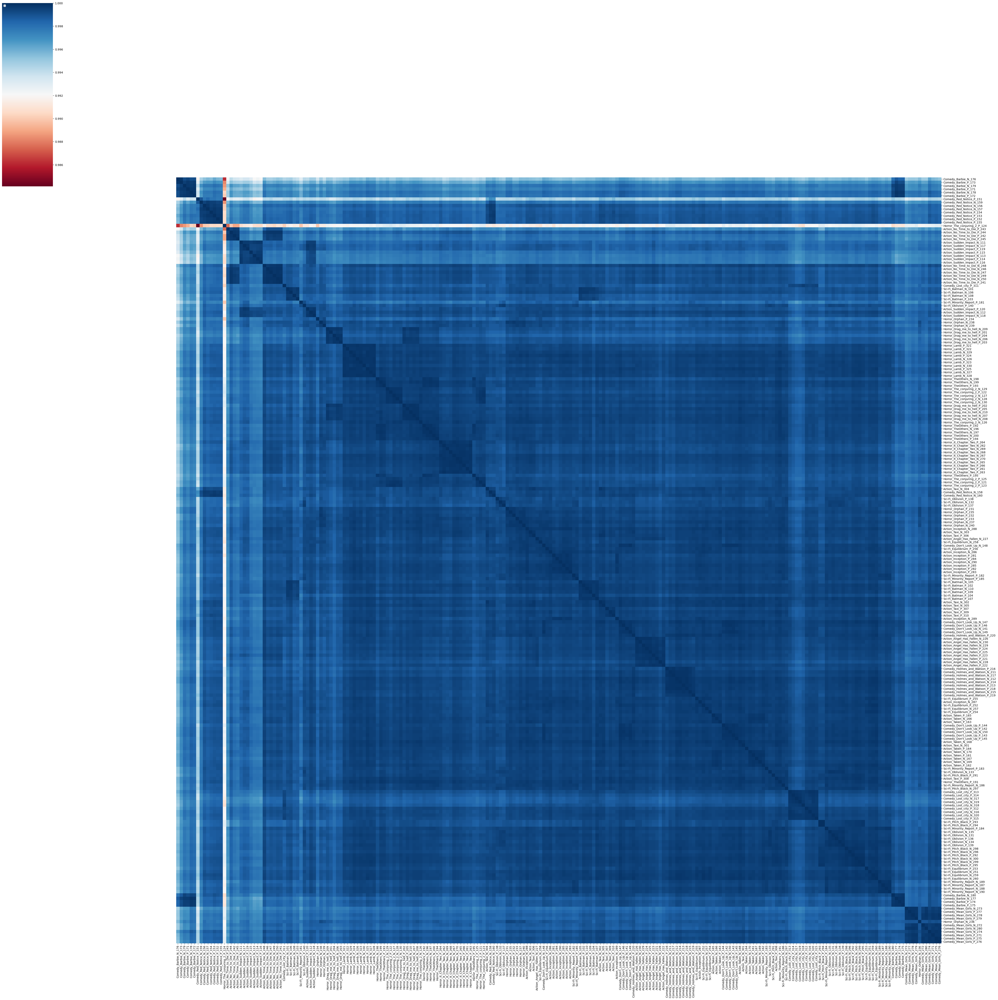

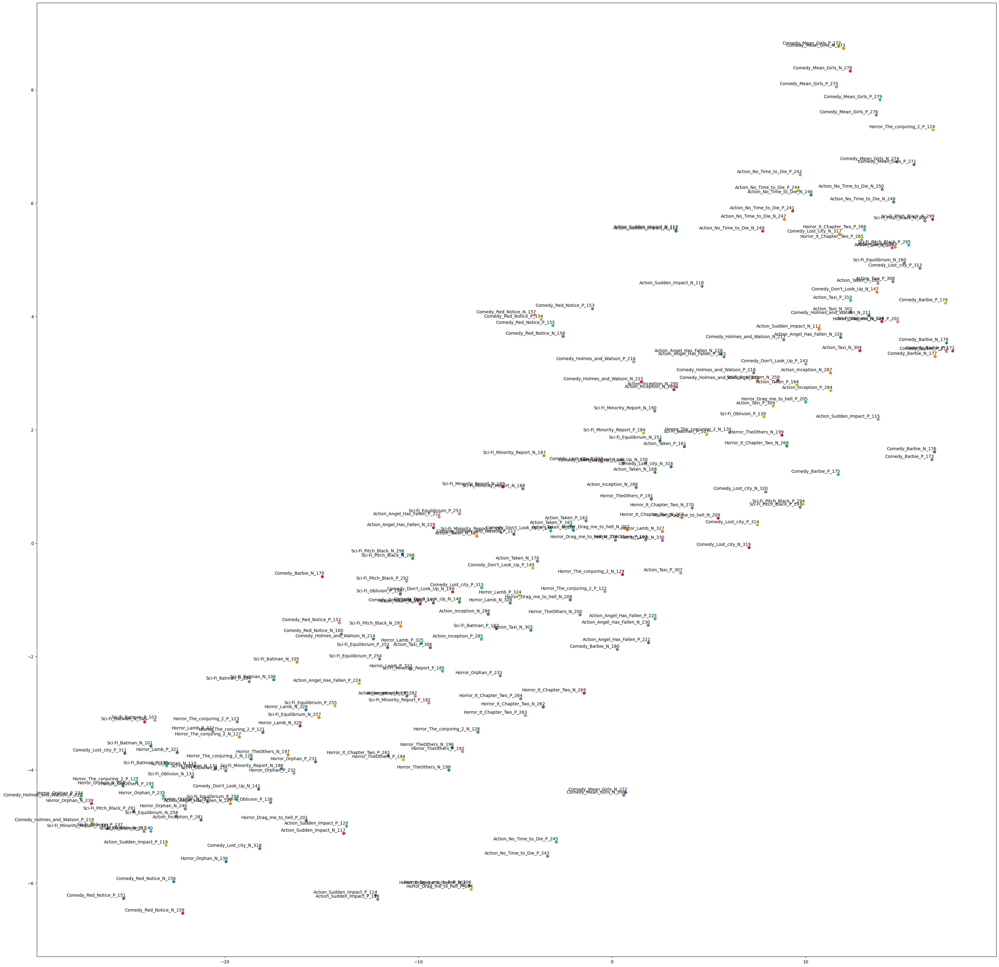

Running Doc2Vec experiment with embedding size: 200


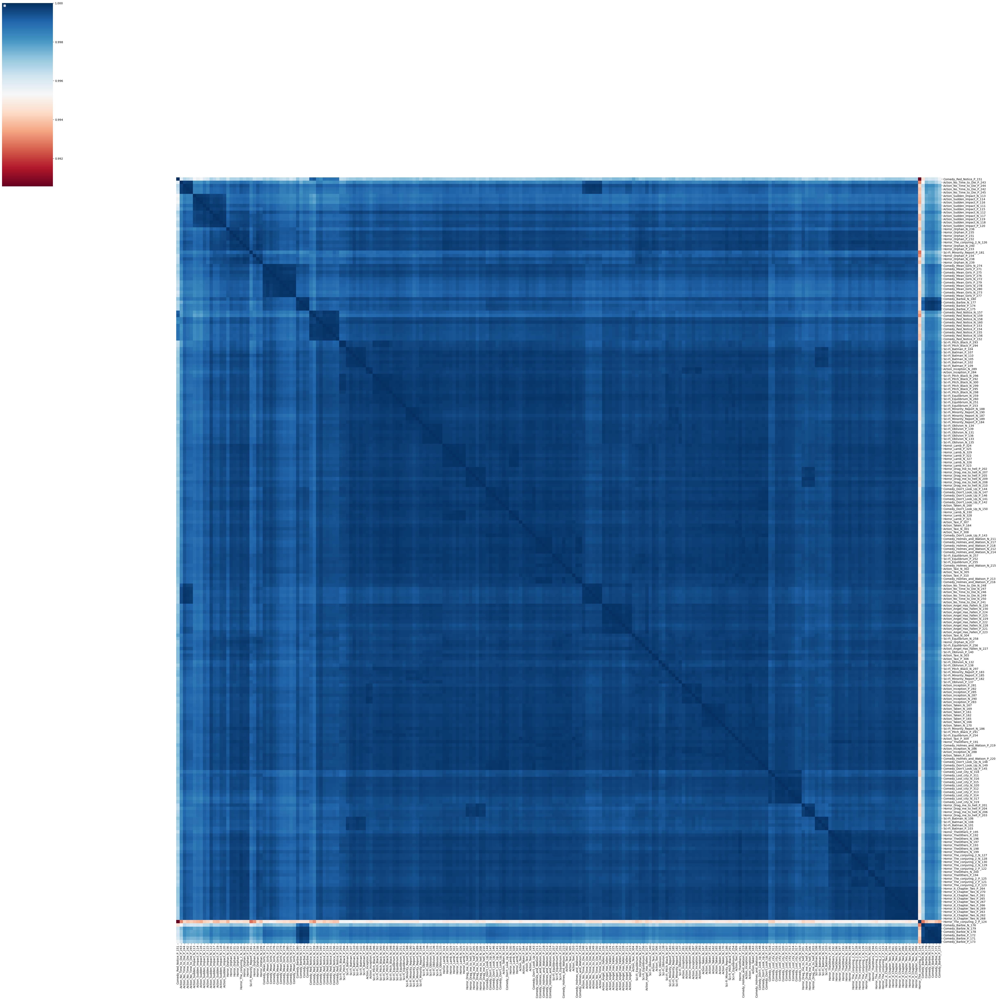

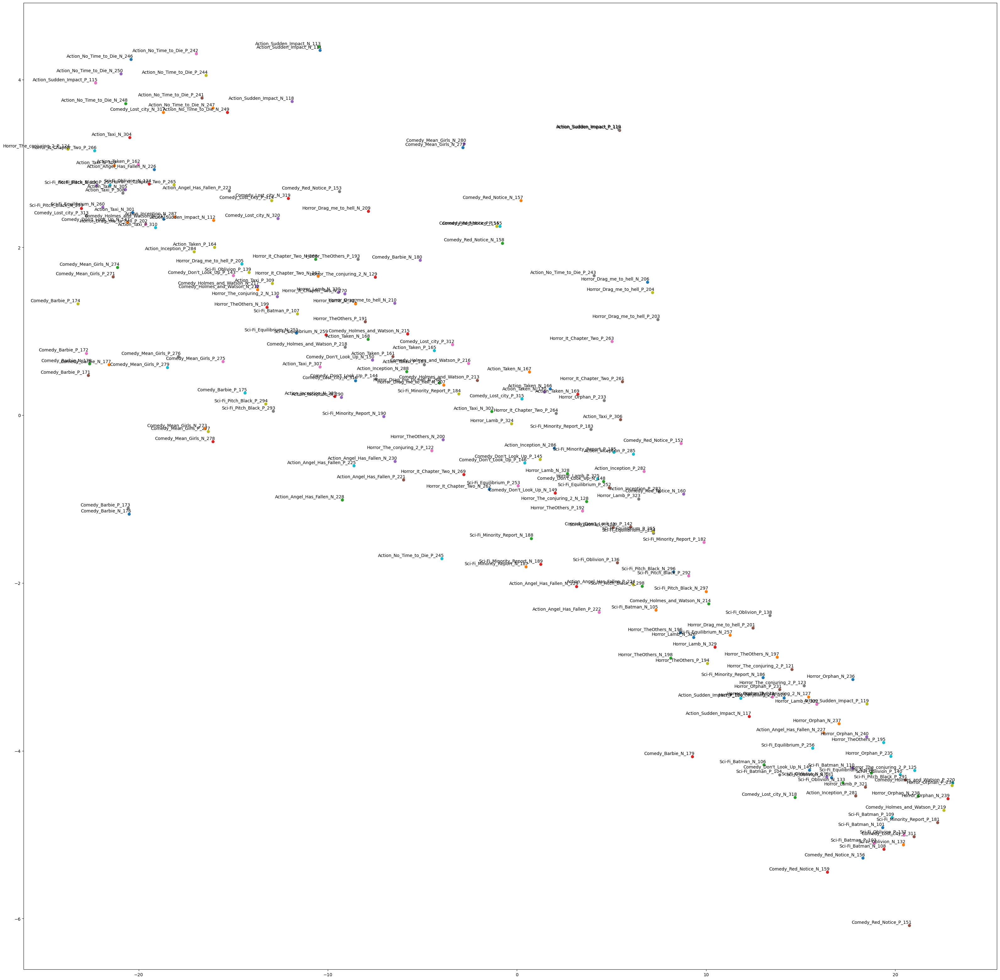

Running Doc2Vec experiment with embedding size: 300


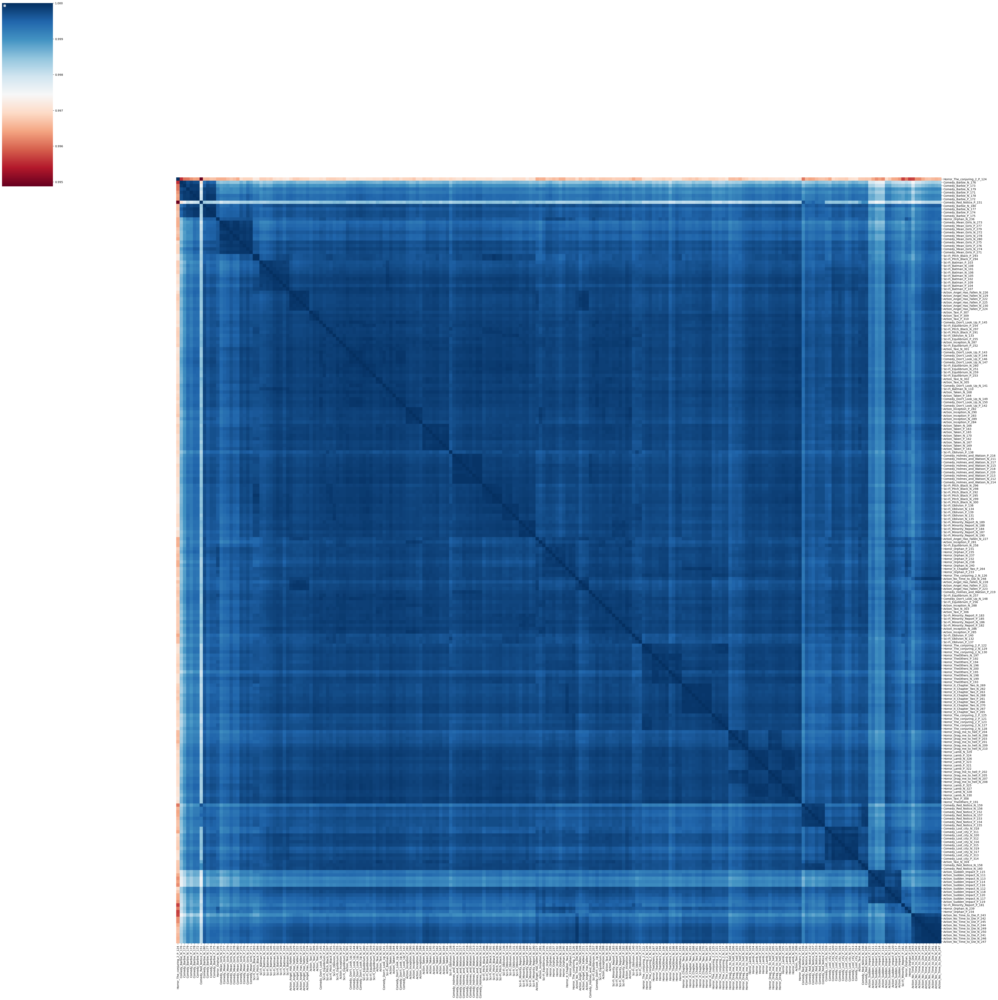

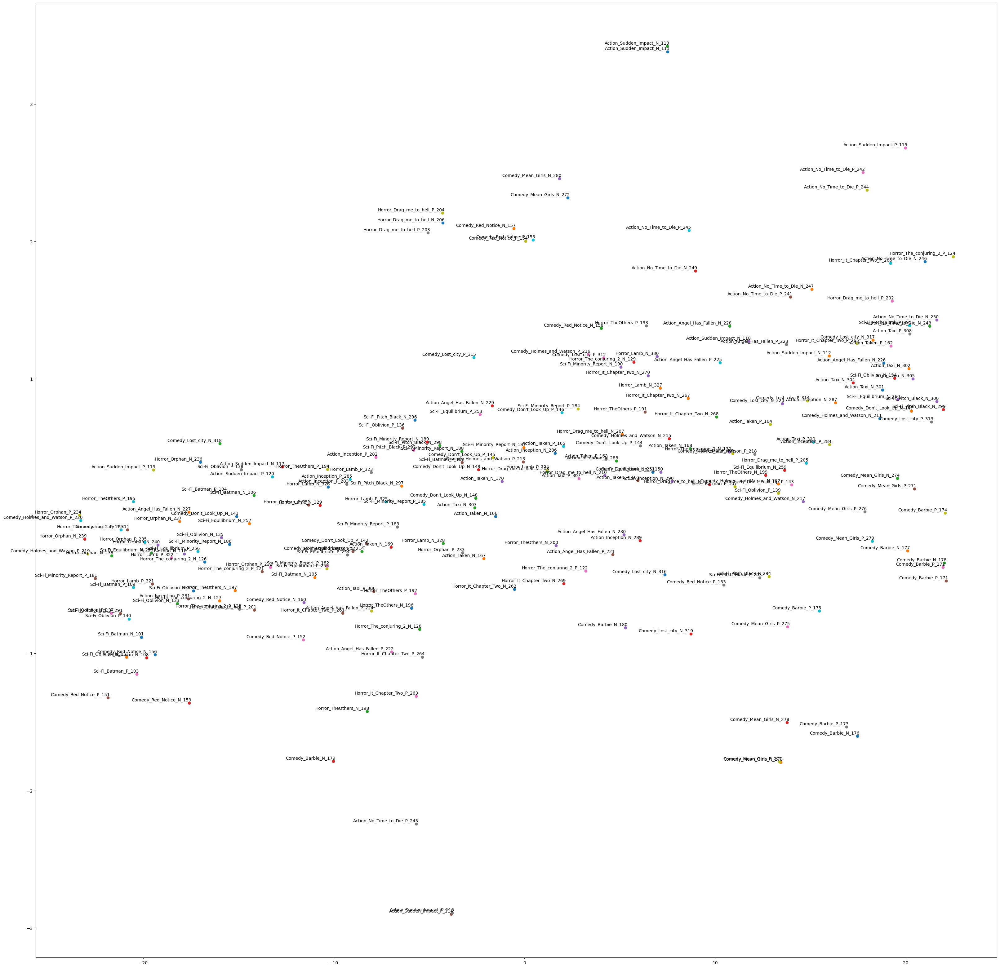

In [37]:
# Doc2Vec: Try 3 different embedding dimensions
embedding_sizes = [100, 200, 300]

for size in embedding_sizes:
    print(f"Running Doc2Vec experiment with embedding size: {size}")
    run_doc2vec_experiment(documents, clean_method, size, f'Doc2Vec_exp_{size}')

## **ELMO Emeddings**

Explore ELMo (Embeddings from Language Models) embeddings to enhance our text analysis capabilities. Unlike traditional word embeddings that represent words with static vectors, ELMo provides context-aware embeddings, capturing the nuanced meanings of words based on their usage.

This is a TensorFlow 1 version of ELMo, available at Kaggle https://www.kaggle.com/models/google/elmo/frameworks/tensorFlow1/variations/elmo/versions/3 , compatible with modern Python environments, and we use TensorFlow 2 code instead.

In [38]:
! pip install tensorflow tensorflow-hub

In [39]:
import tensorflow_hub as hub
import tensorflow as tf
import pandas as pd

In [40]:
# TENSOR FLOW 2.x VARIATION

# Load the ELMo model
elmo = hub.load("https://tfhub.dev/google/elmo/3")
embeddings = elmo.signatures['default'](tf.constant(["I have a pen", "I have an apple"]))['elmo']

print(embeddings)


tf.Tensor(
[[[-1.2254355  -0.56004155 -0.17601362 ... -0.48899472 -0.15847605
   -0.02072026]
  [-0.06928669 -0.32243836 -0.20192209 ...  0.06436353 -0.01132806
    0.23569691]
  [ 0.08227284 -0.13877694 -0.11335732 ...  0.09817557 -0.39810365
    0.1064739 ]
  [-0.59798044 -0.06444039 -0.62319255 ...  0.09078256  0.02052066
    0.28290296]]

 [[-1.2254355  -0.56004155 -0.17601362 ... -0.47857666 -0.06792711
    0.08927003]
  [-0.06928669 -0.32243836 -0.20192209 ...  0.31662846  0.21778789
    0.25088534]
  [-0.15906422 -0.04295161 -0.49626738 ...  0.30489403 -0.08282581
    0.16055614]
  [ 0.33383614 -0.15934686  0.57856274 ...  0.14826375  0.4691132
    0.6117441 ]]], shape=(2, 4, 1024), dtype=float32)


In [41]:
def get_elmo_embeddings(texts):
    """
    Generate ELMo embeddings for a list of texts.

    Parameters:
    - texts: List of strings

    Returns:
    - A Tensor containing the ELMo embeddings for the input texts.
    """
    # Convert texts to TensorFlow constants
    text_tf = tf.constant(texts)

    # Generate ELMo embeddings
    embeddings = elmo.signatures['default'](text_tf)['elmo']

    return embeddings

In [42]:
#documents

In [43]:
# NO DATA WRANGLING
texts = corpus_df['Text'].tolist()

# OR UNCOMMENT FOR DATA WRANGLING
#cleaned_documents = clean_method(documents)
#texts = [' '.join(x.tokens) for x in cleaned_documents]


In [44]:
# Process in batches to manage memory usage
batch_size = 4
# Start with a smaller batch size to monitor performance
# 4 works in Google Collab

all_embeddings = []

# GET ELMO EMBEDDINGS OVER A SUBSET OF ALL MOVIE REVIEWS
sample_size=20

# OR UNCOMMENT TO RUN FOR ALL MOVIE REVIEWS
# Note: Processing all reviews takes over 30 minutes to run.
#sample_size= len(texts)


for i in range(0, sample_size, batch_size):
    batch_texts = texts[i:i+batch_size]
    batch_embeddings = get_elmo_embeddings(batch_texts)
    all_embeddings.append(batch_embeddings)
    print(f"Processed batch {i//batch_size + 1}/{len(texts)//batch_size + 1}")


Processed batch 1/58
Processed batch 2/58
Processed batch 3/58
Processed batch 4/58
Processed batch 5/58


In [45]:
# Convert the list of tensors to a single numpy array
all_embeddings_np = np.concatenate([batch.numpy().mean(axis=1) for batch in all_embeddings], axis=0)


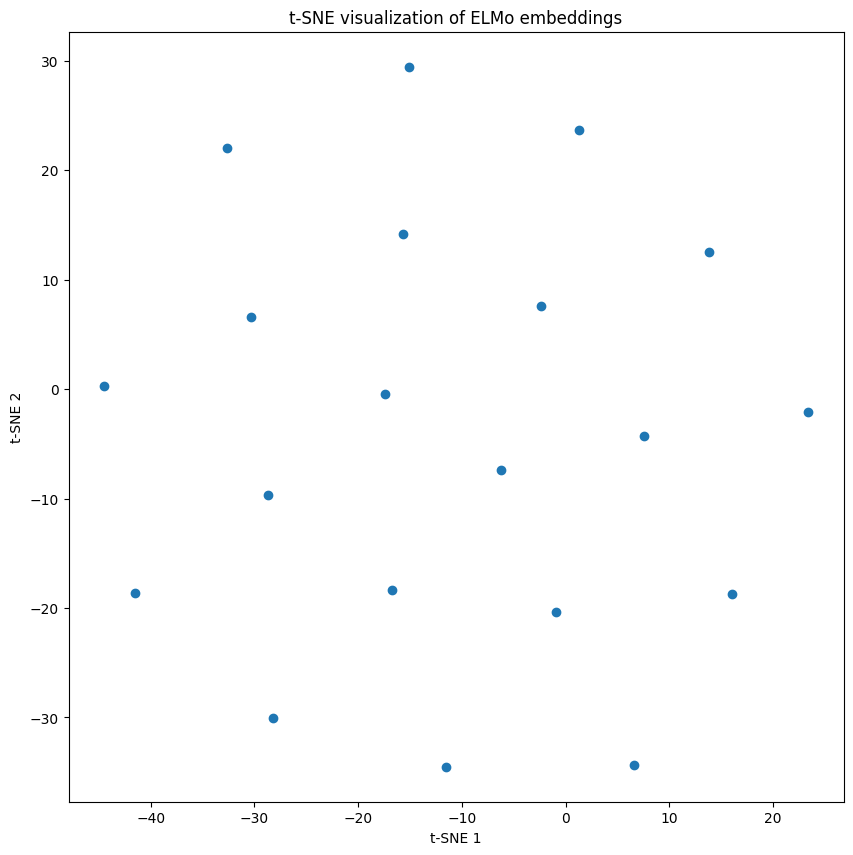

In [46]:
from sklearn.manifold import TSNE
import matplotlib.pyplot as plt

# Use t-SNE to reduce dimensionality for visualization
if (sample_size>=30):
    tsne = TSNE(n_components=2, random_state=42)
else:
    # Default perplexity is too large for a small sample size
    tsne = TSNE(n_components=2, random_state=42, perplexity=sample_size-1)

embeddings_tsne = tsne.fit_transform(all_embeddings_np)

# Plot
plt.figure(figsize=(10, 10))
plt.scatter(embeddings_tsne[:, 0], embeddings_tsne[:, 1])
plt.title('t-SNE visualization of ELMo embeddings')
plt.xlabel('t-SNE 1')
plt.ylabel('t-SNE 2')
plt.show()


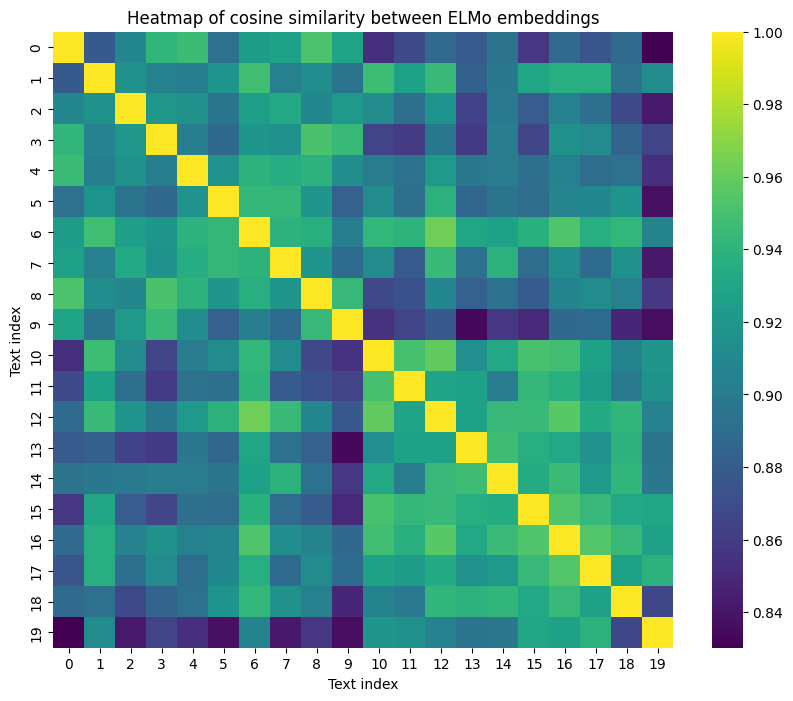

In [47]:
from sklearn.metrics.pairwise import cosine_similarity
import seaborn as sns

# Compute the cosine similarity matrix
similarity_matrix = cosine_similarity(all_embeddings_np)

# Plot as a heatmap
plt.figure(figsize=(10, 8))
sns.heatmap(similarity_matrix, cmap='viridis')
plt.title('Heatmap of cosine similarity between ELMo embeddings')
plt.xlabel('Text index')
plt.ylabel('Text index')
plt.show()


In [48]:
! pip freeze

absl-py==1.4.0
accelerate==1.5.2
aiohappyeyeballs==2.6.1
aiohttp==3.11.15
aiosignal==1.3.2
alabaster==1.0.0
albucore==0.0.23
albumentations==2.0.5
ale-py==0.10.2
altair==5.5.0
annotated-types==0.7.0
anyio==4.9.0
argon2-cffi==23.1.0
argon2-cffi-bindings==21.2.0
array_record==0.7.1
arviz==0.21.0
astropy==7.0.1
astropy-iers-data==0.2025.4.14.0.37.22
astunparse==1.6.3
atpublic==5.1
attrs==25.3.0
audioread==3.0.1
autograd==1.7.0
babel==2.17.0
backcall==0.2.0
backports.tarfile==1.2.0
beautifulsoup4==4.13.4
betterproto==2.0.0b6
bigframes==1.42.0
bigquery-magics==0.9.0
bleach==6.2.0
blinker==1.9.0
blis==1.3.0
blosc2==3.3.0
bokeh==3.6.3
Bottleneck==1.4.2
bqplot==0.12.44
branca==0.8.1
CacheControl==0.14.2
cachetools==5.5.2
catalogue==2.0.10
certifi==2025.1.31
cffi==1.17.1
chardet==5.2.0
charset-normalizer==3.4.1
chex==0.1.89
clarabel==0.10.0
click==8.1.8
cloudpathlib==0.21.0
cloudpickle==3.1.1
cmake==3.31.6
cmdstanpy==1.2.5
colorcet==3.1.0
colorlover==0.3.0
colour==0.1.5
community==1.0.0b1
confe

In [49]:
!pip list --format=freeze

absl-py==1.4.0
accelerate==1.5.2
aiohappyeyeballs==2.6.1
aiohttp==3.11.15
aiosignal==1.3.2
alabaster==1.0.0
albucore==0.0.23
albumentations==2.0.5
ale-py==0.10.2
altair==5.5.0
annotated-types==0.7.0
anyio==4.9.0
argon2-cffi==23.1.0
argon2-cffi-bindings==21.2.0
array_record==0.7.1
arviz==0.21.0
astropy==7.0.1
astropy-iers-data==0.2025.4.14.0.37.22
astunparse==1.6.3
atpublic==5.1
attrs==25.3.0
audioread==3.0.1
autograd==1.7.0
babel==2.17.0
backcall==0.2.0
backports.tarfile==1.2.0
beautifulsoup4==4.13.4
betterproto==2.0.0b6
bigframes==1.42.0
bigquery-magics==0.9.0
bleach==6.2.0
blinker==1.9.0
blis==1.3.0
blosc2==3.3.0
bokeh==3.6.3
Bottleneck==1.4.2
bqplot==0.12.44
branca==0.8.1
CacheControl==0.14.2
cachetools==5.5.2
catalogue==2.0.10
certifi==2025.1.31
cffi==1.17.1
chardet==5.2.0
charset-normalizer==3.4.1
chex==0.1.89
clarabel==0.10.0
click==8.1.8
cloudpathlib==0.21.0
cloudpickle==3.1.1
cmake==3.31.6
cmdstanpy==1.2.5
colorcet==3.1.0
colorlover==0.3.0
colour==0.1.5
community==1.0.0b1
confe